## Performance test

Useful functions

In [1]:
import os
import cv2 
import json
import random
import numpy as np
import matplotlib.pyplot as plt

# Extracts the colors associated with the specified class of interest from a single JSON file.
def extract_class_colors(file_path, class_of_interest):
    """
    Extracts the colors associated with the specified class of interest from a single JSON file.
    
    Args:
        file_path (str): Path to the JSON file.
        class_of_interest (str): The class name to search for in the JSON file.
        
    Returns:
        list: List of colors associated with the class of interest.
    """
    
    # Open and read the JSON file
    with open(file_path, 'r') as json_file:
        data = json.load(json_file)
        
        # Search for the class of interest in the JSON file
        for color, class_info in data.items():
            class_name = class_info.get("class", "")
            if class_name == class_of_interest:
                return color 

# Retrieves the class ID from the bounding box labels file based on the class name.
def get_class_id_from_labels(label_file_path, class_of_interest):
    """
    Retrieves the class ID from the bounding box labels file based on the class name.
    
    Args:
        label_file_path (str): Path to the JSON file containing class labels.
        class_of_interest (str): Class name to search for.
        
    Returns:
        int: The class ID corresponding to the class of interest.
    """
    with open(label_file_path, 'r') as json_file:
        label_data = json.load(json_file)
        
        # Find the class ID for the class of interest
        for class_id, class_info in label_data.items():
            if class_info["class"] == class_of_interest:
                return int(class_id)
    
    return None  # Return None if class is not found

# Extracts the bounding boxes for the given class from the .npy file.
def find_bounding_boxes(bb_folder, label_folder, file_id, class_of_interest):
    """
    Extracts the bounding boxes for the given class from the .npy file.
    
    Args:
        bb_folder (str): Path to the folder containing bounding box files.
        label_folder (str): Path to the folder containing label JSON files.
        file_id (str): The image ID to form the bounding box file name.
        class_of_interest (str): The class name to filter the bounding boxes.
        
    Returns:
        np.ndarray: The bounding boxes corresponding to the class.
    """
    # Get class ID from the label file
    label_file_path = os.path.join(label_folder, f'{file_id}_bounding_box_2d_tight_labels.json')
    class_id = get_class_id_from_labels(label_file_path, class_of_interest)
    
    if class_id is None:
        #print(f"Class '{class_of_interest}' not found in {label_file_path}.")
        return np.array([])
    
    # Load the bounding box npy file
    bb_file_path = os.path.join(bb_folder, f'{file_id}_bounding_box_2d_tight.npy')
    
    if not os.path.exists(bb_file_path):
        print(f"Bounding box file {bb_file_path} not found.")
        return np.array([])
    
    bounding_boxes = np.load(bb_file_path)
    
    # Filter bounding boxes for the class ID (assuming class ID is stored in the first column)
    filtered_bboxes = [bbox for bbox in bounding_boxes if bbox[0] == class_id]
    
    return np.array(filtered_bboxes)

# Crops the image based on the bounding box.
def crop_image_with_bbox(image, bbox):
    """
    Crops the image based on the bounding box.
    
    Args:
        image (np.ndarray): The image to be cropped.
        bbox (tuple): The bounding box in the format (x_min, y_min, x_max, y_max).
        
    Returns:
        np.ndarray: The cropped image.
    """
    x_min, y_min, x_max, y_max = int(bbox[1]), int(bbox[2]), int(bbox[3]), int(bbox[4])
    return image[y_min:y_max, x_min:x_max]

# Updates the result dictionary with the given file ID, IOU, and distance error.
def update_class_results(results_dict, file_id, iou, distance_error):
    """
    Updates the result dictionary with the given file ID, IOU, and distance error.
    
    Args:
        results_dict (list): The class result list to be updated.
        file_id (str): The file ID.
        iou (float): The IOU value.
        distance_error (float): The distance error value.
    """
    results_dict.append({
        'ID': file_id,
        'IOU': iou,
        'Distance error': distance_error
    })

# Plot images from a matrix, where each element in the matrix is an image.
def plot_images_from_matrix(image_matrix, title_matrix):
    """
    Plot images from a matrix, where each element in the matrix is an image.
    Differentiates between RGB and depth images.

    Parameters:
    - image_matrix: A 2D list or numpy array where each element is an image.
    """
    # Check if image_matrix is a numpy array or a 2D list
    #if isinstance(image_matrix, np.ndarray):
    #    num_rows, num_cols = image_matrix.shape[:2]
    #elif isinstance(image_matrix, list) and all(isinstance(row, list) for row in image_matrix):
    num_rows = len(image_matrix)
    num_cols = len(image_matrix[0]) if num_rows > 0 else 0
    #else:
    #    raise TypeError("image_matrix must be a 2D list or numpy array")

    # Create a figure with subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 5))
    
    # If there's only one row, axes is not a 2D array
    if num_rows == 1:
        axes = np.expand_dims(axes, 0)

    for row in range(num_rows):
        for col in range(num_cols):
            try:
                img = image_matrix[row][col]
                
                # Check if img is a numpy array
                if isinstance(img, list):
                    img = np.array(img)
                
                # Ensure the image is a numpy array
                if not isinstance(img, np.ndarray):
                    raise TypeError("Each image must be a numpy array or list.")
                
                # Check the number of channels
                if img.ndim == 2:  # Depth image
                    ax = axes[row][col]
                    ax.imshow(img, cmap='gray')  # Display depth image in grayscale
                    ax.set_title(title_matrix[row][col])
                    ax.axis('off')
                elif img.ndim == 3 and img.shape[2] == 3:  # RGB image
                    ax = axes[row][col]
                    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    ax.imshow(img_rgb)  # Display RGB image
                    ax.set_title(title_matrix[row][col])
                    ax.axis('off')
                else:
                    raise ValueError("Image must be either RGB or depth format.")

            except IndexError:
                print(f"IndexError: No image found at ({row}, {col})")
            except Exception as e:
                print(f"Error at ({row}, {col}): {e}")

    plt.tight_layout()
    plt.show()

# Plots multiple images side by side with custom titles.
def plot_images_side_by_side(images, titles):
    """
    Plots multiple images side by side with custom titles.
    
    Args:
        images (list of np.array): List of images to display.
        titles (list of str): List of titles for the images.
    """
    num_images = len(images)
    
    # Create subplots with the appropriate number of columns
    fig, axes = plt.subplots(1, num_images, figsize=(12, 6))
    
    # Handle the case where there is only one image
    if num_images == 1:
        axes = [axes]
    
    # Plot each image with its corresponding title
    for i in range(num_images):
        axes[i].imshow(images[i], cmap='gray')
        axes[i].set_title(titles[i])
        axes[i].axis('off')
    
    plt.show()

# Calculate mAP@50 for a given set of results..    
def calculate_map50(results):
    """
    Calculate mAP@50 for a given set of results.
    Each result is assumed to have:
    - 'IoU': Intersection over Union for each prediction.
    - 'confidence': Confidence score for each prediction.
    - 'is_tp': Whether the prediction is a true positive.
    """
    
    true_positives = 0
    false_positives = 0
    total_ground_truths = len(results)

    precision = []
    recall = []

    for i, result in enumerate(results):
        if result['IOU'] >= 0.50:
            true_positives += 1
        else:
            false_positives += 1
        
        precision.append(true_positives / (true_positives + false_positives))
        recall.append(true_positives / total_ground_truths)
    
    # Calculate Average Precision (AP) for the class
    ap = 0.0
    for i in range(1, len(precision)):
        ap += (recall[i] - recall[i-1]) * precision[i]

    return ap

# Calculate average IOU and distance error for a given class.    
def calculate_class_averages(results):
    """
    Calculate average IOU and distance error for a given class.
    
    Args:
        results (list of dicts): List containing dictionaries with 'ID', 'IOU', and 'Distance error'.
        class_name (str): The class name to filter results for.
    
    Returns:
        dict: A dictionary with average IOU and average distance error.
    """
    
    # Extract IOU and distance error values
    iou_values = [result['IOU'] for result in results]
    distance_errors = [result['Distance error'] for result in results if result['IOU'] > 0] 
    
    # Calculate averages
    average_iou = sum(iou_values) / len(iou_values) if iou_values else 0
    average_distance_error = sum(distance_errors) / len(distance_errors) if distance_errors else 0
    
    # Calculate mAP@50 for the current class
    map50 = calculate_map50(results)
    
    return {
        'Average IOU': average_iou,
        'Average Distance error': average_distance_error,
        'mAP': map50
    }
    

/home/tumwfml-ubunt6/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


Functions for results comparison

In [16]:
import cv2
import time 
from scipy.signal import find_peaks
import matplotlib.patches as patches

# Draw a bounding box on the given axes with the specified color.
def draw_bounding_box(ax, bbox, color):
    """
    Draw a bounding box on the given axes with the specified color.
    
    Args:
        ax (matplotlib.axes): The axes on which to draw the bounding box.
        bbox (tuple): The bounding box coordinates as (x_min, y_min, x_max, y_max).
        color (tuple): The color to use for the bounding box in RGB format.
    """
    class_id , x_min, y_min, x_max, y_max, _ = bbox
    width = x_max - x_min
    height = y_max - y_min

    # Create a rectangle patch and add it to the axes
    rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor=color, facecolor='none')
    ax.add_patch(rect)

# Apply the mask to keep only the pixels with the specific color
def generate_mask(image, color, occlusion_rate = 0.20):
    """
    Generate a mask for the pixels matching the given color, and return an error if the class 
    occupies less than 50% of the image.

    Args:
        image (np.array): The input image (segmentation image).
        color (str): The color of the class in the format "(B, G, R, A)".
    
    Returns:
        mask (np.array): The binary mask for the specified class.
    
    Raises:
        ValueError: If the class occupies less than 50% of the pixels in the image.
    """
    # Clean the color string and convert to integers
    color = color.strip("()").replace(" ", "")  # Remove parentheses and spaces
    color_values = color.split(",")  # Split by comma
    b, g, r, a = map(int, color_values[:4])

    # Rearrange to RGB format
    rgb_tuple = [r, g, b, a]

    # Create the mask for pixels matching the RGB values
    mask = np.all(image == rgb_tuple, axis=-1)  # Mask for class

    # Calculate the proportion of pixels that match the class color
    total_pixels = image.shape[0] * image.shape[1]
    matching_pixels = np.sum(mask)

     # Check if total_pixels is zero to avoid division by zero
    if total_pixels == 0:
        raise ValueError("The image has no pixels (total_pixels = 0).")
    
    # Check if the proportion of matching pixels is less than 30%
    if matching_pixels / total_pixels < occlusion_rate:
        raise ValueError("Class occupies less than", occlusion_rate, f"of the pixels in the image ({(matching_pixels / total_pixels) * 100:.2f}%).")

    return mask

# Crop a depth image using a mask. The pixels outside the mask are set to 0.
def crop_depth_image_with_mask(depth_image, mask):
    """
    Crop a depth image using a mask. The pixels outside the mask are set to 0.

    Args:
        depth_image (numpy.ndarray): The depth image (2D array with depth values).
        mask (numpy.ndarray): The mask (2D boolean array where True represents the region to keep).

    Returns:
        cropped_depth (numpy.ndarray): The depth image with only masked regions kept, others set to 0.
    """
    # Ensure the mask is a boolean array
    mask = mask.astype(bool)
    
    # Create an empty array with the same shape as the depth image, initialized to 0
    cropped_depth = np.zeros_like(depth_image)
    
    # Set the values in the cropped_depth where the mask is True
    cropped_depth[mask] = depth_image[mask]
    
    return cropped_depth


 # Define a helper function to calculate range and element count for a peak

# Calculate the right and left margins around a peak
def calculate_peak_region(peak_index, hist, h_threshold):
    left_edge = peak_index
    right_edge = peak_index

    # Extend edges based on std_dev threshold
    while left_edge > 0 and hist[left_edge] > h_threshold:
        left_edge -= 1
    while right_edge < len(hist) - 1 and hist[right_edge] > h_threshold:
        right_edge += 1

    # Calculate the number of elements within this range
    element_count = np.sum(hist[left_edge:right_edge+1])

    return left_edge, right_edge, element_count

# Apply depth histogram filter using accumulative sum
def apply_cumulative_hist_depth_filter(depth_image, ignore_background = False, resolution = 1, max_height_percent = 5):
     # Flatten the depth image to analyze the depth values
    depth_values = depth_image.flatten()
    # Filter out inf and NaN values
    depth_values = depth_values[np.isfinite(depth_values)] # Exclude zero (no data) values

    if len(depth_values) == 0:
        return depth_image

    bins = round(max(val for val in depth_values if np.isfinite(val)) * resolution)
    
    # Calculate the histogram of depth values
    hist, bin_edges = np.histogram(depth_values, bins=bins)
    max_peak_index = np.argmax(hist)
    min_height = hist[max_peak_index]*max_height_percent/100
    
    # Detect peaks in the histogram
    threshold = max(np.average(hist[:]), min_height)
    peaks = np.where(hist > threshold)[0]

    min_height = hist[max_peak_index]*max_height_percent/100
    
    if len(peaks) > 0:
        results_dict = []
        # Assume the most significant peak is the object of interest
        for peak in peaks:
            left_edge, right_edge, count = calculate_peak_region(peak, hist, min_height)
            results_dict.append({
            'left_edge': left_edge,
            'right_edge': right_edge,
            'count': count
        })

        # Sort results_dict by 'count' in descending order
        sorted_results = sorted(results_dict, key=lambda x: x['count'], reverse=True)
        
        # Remove duplicates based on (left_edge, right_edge)
        unique_results = { (item['left_edge'], item['right_edge']): item for item in sorted_results }

        # Convert back to a list of dictionaries
        sorted_results = list(unique_results.values())

        # Find the element with the largest count, excluding the last peak if remove_background is True
        if ignore_background:
            dominant_peak = next((elem for elem in sorted_results if elem['right_edge'] != len(hist) - 1), sorted_results[0])
        else:
            dominant_peak = sorted_results[0]

        left_edge = dominant_peak['left_edge']
        right_edge = dominant_peak['right_edge']
        lower_bound = bin_edges[left_edge]
        upper_bound = bin_edges[right_edge]

        # Create a mask to filter out depth values outside the range
        mask = (depth_image >= lower_bound) & (depth_image <= upper_bound)

        # Apply the mask to the depth image
        filtered_image = np.where(mask, depth_image, 0)

        return filtered_image, hist, bin_edges, lower_bound, upper_bound, threshold, min_height

    # If no peaks are found, return the unfiltered image
    print("No peaks found in image")
    return depth_image, hist, bin_edges, np.min(depth_values), np.max(depth_values), threshold, min_height

# Apply depth histogram filter
def apply_hist_depth_filter(depth_image, ignore_background = False, resolution = 1):
    # Flatten the depth image to analyze the depth values
    depth_values = depth_image.flatten()
    depth_values = depth_values[depth_values > 0]  # Exclude zero (no data) values

    if len(depth_values) == 0:
        return depth_image

    # Calculate the standard deviation of the depth values
    max_depth_value = round(max(val for val in depth_values if np.isfinite(val))/resolution)
    
    # Calculate the histogram of depth values
    hist, bin_edges = np.histogram(depth_values, bins=max_depth_value)
    max_peak_index = np.argmax(hist)
    
    left_edge, right_edge, count = calculate_peak_region(max_peak_index, hist, resolution * 10, depth_values)
    
    lower_bound = bin_edges[left_edge]
    upper_bound = bin_edges[right_edge]

    # Create a mask to filter out depth values outside the range
    mask = (depth_image >= lower_bound) & (depth_image <= upper_bound)

    # Apply the mask to the depth image
    filtered_image = np.where(mask, depth_image, 0)

    return filtered_image, hist, bin_edges, lower_bound, upper_bound, hist[max_peak_index]/10

# Compare a ground truth mask with a depth mask.
def compare_masks(ground_truth_mask, depth_mask):
    """
    Compare a ground truth mask with a depth mask.

    Parameters:
    - ground_truth_mask: Binary ground truth mask (numpy array).
    - depth_mask: Depth mask with values from 0 to 1 (numpy array).

    Returns:
    - IoU: Intersection over Union metric.
    """
    # Threshold depth mask to binary
    thresholded_depth_mask = (depth_mask > 0).astype(np.uint8)
    
    # Compute intersection and union
    intersection = np.logical_and(ground_truth_mask, thresholded_depth_mask)
    union = np.logical_or(ground_truth_mask, thresholded_depth_mask)
    
    # Calculate Intersection over Union (IoU)
    iou = np.sum(intersection) / np.sum(union) if np.sum(union) > 0 else 0
    
    return round(iou,2)

# Estimate the 3D distance of an object from the camera.
def estimate_3d_distance(depth_image, camera_parameters_path):
    """
    Estimate the 3D distance of an object from the camera.

    Parameters:
    - depth_image: The cropped depth image (filtered).
    - camera_parameters_path" The path to the camera parameter file

    Returns:
    - 3D distance (z-coordinate) from the camera.
    """

    # Extract intrinsic parameters
    with open(camera_parameters_path, 'r') as f:
        data = json.load(f)

    # Camera intrinsics
    focal_length = data["cameraFocalLength"] # [f_x, f_y]
    resolution = data["renderProductResolution"]  # [width, height]
    c_x, c_y = resolution[0] / 2, resolution[1] / 2  # Center of the image
    

    # Get the indices of non-zero depth values (i.e., where the object is)
    non_zero_indices = np.nonzero(depth_image)
    
    if len(non_zero_indices[0]) == 0:
        raise ValueError("No valid depth values found in the cropped image.")

    # Calculate the average depth value for the object
    average_depth = np.mean(depth_image[non_zero_indices])

    # Calculate the pixel coordinates of the object's centroid
    u = np.mean(non_zero_indices[1])  # x-coordinate (width)
    v = np.mean(non_zero_indices[0])  # y-coordinate (height)

    # Convert pixel coordinates (u, v) and depth (z) to real-world coordinates (X, Y, Z)
    Z = average_depth  # Depth value directly corresponds to Z
    X = (u - c_x) * Z / focal_length / 10
    Y = (v - c_y) * Z / focal_length / 10

    # The 3D distance from the camera is the magnitude of the vector (X, Y, Z)
    distance = np.sqrt(X**2 + Y**2 + Z**2)
    return distance, (X, Y, Z)

# Compare two 3D poses using Euclidean distance.
def compare_poses(predicted_pose, ground_truth_pose):
    """
    Compare two 3D poses using Euclidean distance.
    
    Args:
        predicted_pose (tuple or list): The predicted pose (X, Y, Z) in 3D space.
        ground_truth_pose (tuple or list): The ground truth pose (X, Y, Z) in 3D space.
    
    Returns:
        distance (float): The Euclidean distance between the predicted and ground truth pose.
    """
    # Convert the poses to numpy arrays for easier calculation
    predicted_pose = np.array(predicted_pose)
    ground_truth_pose = np.array(ground_truth_pose)
    
    # Calculate the Euclidean distance between the two poses
    distance = np.linalg.norm(predicted_pose - ground_truth_pose)
    
    return round(distance,2)

# Calculate the overall average IOU and Distance Error across multiple classes.
def calculate_overall_average(*class_results):
    """
    Calculate the overall average IOU and Distance Error across multiple classes.
    
    Args:
        class_results (list of lists): Lists of results for different classes.
        
    Returns:
        dict: A dictionary containing the overall average IOU and average Distance Error.
    """
    all_results = []
    
    # Flatten all the class results into one list and filter out IOU = 0
    for results in class_results:
        all_results.extend([result for result in results if result['IOU'] > 0])
    
    if not all_results:
        return {'Overall Average IOU': 0, 'Overall Average Distance error': 0}
    
    # Calculate the overall averages
    overall_average_iou = sum(result['IOU'] for result in all_results) / len(all_results)
    overall_average_distance_error = sum(result['Distance error'] for result in all_results) / len(all_results)
    
    return {
        'Overall Average IOU': overall_average_iou,
        'Overall Average Distance error': overall_average_distance_error
    }

# Plots visual examples for each class in a 5x5 grid.      
def plot_class_examples(classes, resolution, height_percentage,
                        forklift_results, pallet_truck_results, pallet_results, klt_results, stillage_results, 
                        rgb_image_folder, depth_image_folder, segmentation_image_folder, bb_folder):
    """
    Plots visual examples for each class in a 5x5 grid.
    For each class (forklift, pallet_truck, pallet, klt, stillage), plot the color image with bounding box,
    cropped depth image, histogram analysis, ground truth, and filtered depth image (prediction).
    
    Args:
        forklift_results (list): Results for forklift class.
        pallet_truck_results (list): Results for pallet_truck class.
        pallet_results (list): Results for pallet class.
        klt_results (list): Results for klt class.
        stillage_results (list): Results for stillage class.
        rgb_image_folder (str): Path to the images folder.
        depth_image_folder (str): Path to the depth images folder.
        segmentation_image_folder (str): Path to the segmentation images folder.
        bb_folder (str): Path to the bounding box folder.
    """
    # Variable to accumulate total time
    total_time = 0
    ignore_background = False
    fig, axes = plt.subplots(5, 5, figsize=(25, 25))
    results_lists = [forklift_results, pallet_truck_results, pallet_results, klt_results, stillage_results]

    for i, (class_name, class_results) in enumerate(zip(classes, results_lists)):
        if (class_name == 'forklift' or class_name == 'pallet_truck'):
            ignore_background = True
        else: ignore_background = False
        if len(class_results) == 0:
            # Skip this row if there are no results for the class
            continue
        
        print ("Class results", class_results)
        
        try:
            # Select a random result for this class
            if len(class_results) > 1:
            # Select a random element if there are multiple results
                random_result = random.choice(class_results)
            elif class_results:  # Ensures there is at least one element
            # Take the only element if there's exactly one
                random_result = class_results[0]
            
            file_id = random_result['ID']
            iou = random_result['IOU'] 
            distance_error = random_result['Distance error']
            
            color_image_path = os.path.join(rgb_image_folder, f'{file_id}_rgb.png')  # Adjust if the color image path is different
            depth_image_path = os.path.join(depth_image_folder, f'{file_id}_distance_to_camera.npy')
            segmentation_image_path = os.path.join(segmentation_image_folder, f'{file_id}_semantic_segmentation.png')
            segmentation_label_path = os.path.join(segmentation_image_folder, f'{file_id}_semantic_segmentation_labels.json')

            if not (os.path.exists(color_image_path)): 
                print(f"Files not found: {color_image_path}")
                return
            elif not (os.path.exists(depth_image_path)):
                print(f"Files not found: {depth_image_path}")
                return
            elif not (os.path.exists(segmentation_image_path)):
                print(f"Files not found: {segmentation_image_path}")
                return
            elif not (os.path.exists(segmentation_label_path)):
                print(f"Files not found: {segmentation_label_path}")
                return
            
            color_image = cv2.imread(color_image_path, cv2.IMREAD_COLOR)  # BGR format
            color_image_rgb = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display
            depth_image = np.load(depth_image_path)  # Load depth image
            segmentation_image = cv2.imread(segmentation_image_path, cv2.IMREAD_UNCHANGED)  # Load segmentation image

            # Extract bounding boxes and other relevant information for this class
            bounding_boxes = find_bounding_boxes(bb_folder, bb_folder, file_id, class_name)
            if len(bounding_boxes) > 0:
                bbox = random.choice(bounding_boxes)  # Pick one random bounding box

                # Crop images based on the bounding box
                class_color = extract_class_colors(segmentation_label_path, class_name)
                cropped_depth = crop_image_with_bbox(depth_image, bbox)
                cropped_segmentation = crop_image_with_bbox(segmentation_image, bbox)
                masked_segmented_images = generate_mask(cropped_segmentation, class_color)

                ground_truth = crop_depth_image_with_mask(cropped_depth, masked_segmented_images)
                
                start_time = time.time()
                prediction, hist, bin_edges, lower_bound, upper_bound, average_height, min_height = apply_cumulative_hist_depth_filter(cropped_depth, ignore_background, resolution, height_percentage)
                # Calculate elapsed time
                elapsed_time = time.time() - start_time
                total_time += elapsed_time
                
                # Get the color from the segmentation mask (class-specific)
                if class_color is not None:

                    # Clean the color string and convert to integers
                    color = class_color.strip("()").replace(" ", "")  # Remove parentheses and spaces
                    color_values = color.split(",")  # Split by comma
                    b, g, r, a = map(int, color_values[:4])

                    # Rearrange to RGB format
                    rgb_tuple = [r/255, g/255, b/255, a/255]

                    # Plot images
                    axes[i, 0].imshow(color_image_rgb)  # Color image with bounding box
                    draw_bounding_box(axes[i, 0], bbox, rgb_tuple)
                    axes[i, 0].set_title(f'{class_name} - ID: {file_id}')
                    axes[i, 0].axis('off')

                    axes[i, 1].imshow(cropped_depth, cmap='gray')  # Cropped depth image
                    axes[i, 1].set_title('Cropped Depth')
                    axes[i, 1].axis('off')

                    axes[i, 2].plot(bin_edges[:-1], hist)  # Histogram analysis
                    axes[i, 2].axvline(lower_bound, color='r', linestyle='--', label='Lower Bound')
                    axes[i, 2].axvline(upper_bound, color='g', linestyle='--', label='Upper Bound')
                    axes[i, 2].axhline(average_height, color='orange', linestyle='--', label='Threshold')  # Threshold line
                    axes[i, 2].axhline(min_height, color='b', linestyle='--', label='Min_height')          # Minimum height line 
                    axes[i, 2].set_title('Histogram Analysis')
                    axes[i, 2].legend()

                    axes[i, 3].imshow(ground_truth, cmap='gray')  # Ground truth
                    axes[i, 3].set_title('Ground Truth Depth Mask')
                    axes[i, 3].axis('off')

                    axes[i, 4].imshow(prediction, cmap='gray')  # Filtered depth image (prediction)
                    axes[i, 4].set_title(f'Predicted Depth Mask\nIoU = {iou:.2f}\nIoU = {distance_error:.2f}')
                    axes[i, 4].axis('off')
                    
                    

        except Exception as e:
            print(f"Error processing class {class_name}, ID {file_id}: {str(e)}")
            # class_results.remove(random_result)  # Remove faulty result and retry another one

    # Calculate the average time per iteration
    average_time = total_time / i
    print(f"Average execution time per run: {average_time:.4f} seconds")
    plt.tight_layout()
    plt.show()

# Loads the camera parameter file.  
def load_camera_parameters(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)

    # Camera intrinsics
    focal_length = data["cameraFocalLength"]  # [f_x, f_y]
    resolution = data["renderProductResolution"]  # [width, height]
    c_x, c_y = resolution[0] / 2, resolution[1] / 2  # Center of the image

    # Intrinsic matrix
    K = np.array([
        [focal_length, 0, c_x],
        [0, focal_length, c_y],
        [0, 0, 1]
    ])
    
    # Camera extrinsics (world-to-camera transform)
    camera_view_transform = np.array(data["cameraViewTransform"]).reshape((4, 4))
    R = camera_view_transform[:3, :3]  # Rotation part
    t = camera_view_transform[:3, 3]   # Translation part
    E = np.hstack((R, t.reshape(-1, 1)))  # Extrinsic matrix 3x4

    return K, E

Define the dataset folder

In [14]:
HOME = os.getcwd()
repo_root = os.path.abspath(os.path.join(HOME, "../"))  # Adjust as needed
# Path to the test dataset
folder_path = os.path.join(repo_root, "test_dataset")
print ("Folder path:", folder_path)

Folder path: /home/tumwfml-ubunt6/3D_object_detection/test_dataset


000 ('Class occupies less than', 0.2, 'of the pixels in the image (19.15%).')
008 ('Class occupies less than', 0.2, 'of the pixels in the image (19.11%).')
009 No valid depth values found in the cropped image.
012 No valid depth values found in the cropped image.
017 ('Class occupies less than', 0.2, 'of the pixels in the image (19.69%).')
020 ('Class occupies less than', 0.2, 'of the pixels in the image (18.49%).')
024 ('Class occupies less than', 0.2, 'of the pixels in the image (19.12%).')
036 ('Class occupies less than', 0.2, 'of the pixels in the image (12.79%).')
041 ('Class occupies less than', 0.2, 'of the pixels in the image (2.54%).')
042 ('Class occupies less than', 0.2, 'of the pixels in the image (18.84%).')
043 ('Class occupies less than', 0.2, 'of the pixels in the image (4.68%).')
048 No valid depth values found in the cropped image.
050 ('Class occupies less than', 0.2, 'of the pixels in the image (16.29%).')
051 ('Class occupies less than', 0.2, 'of the pixels in the 

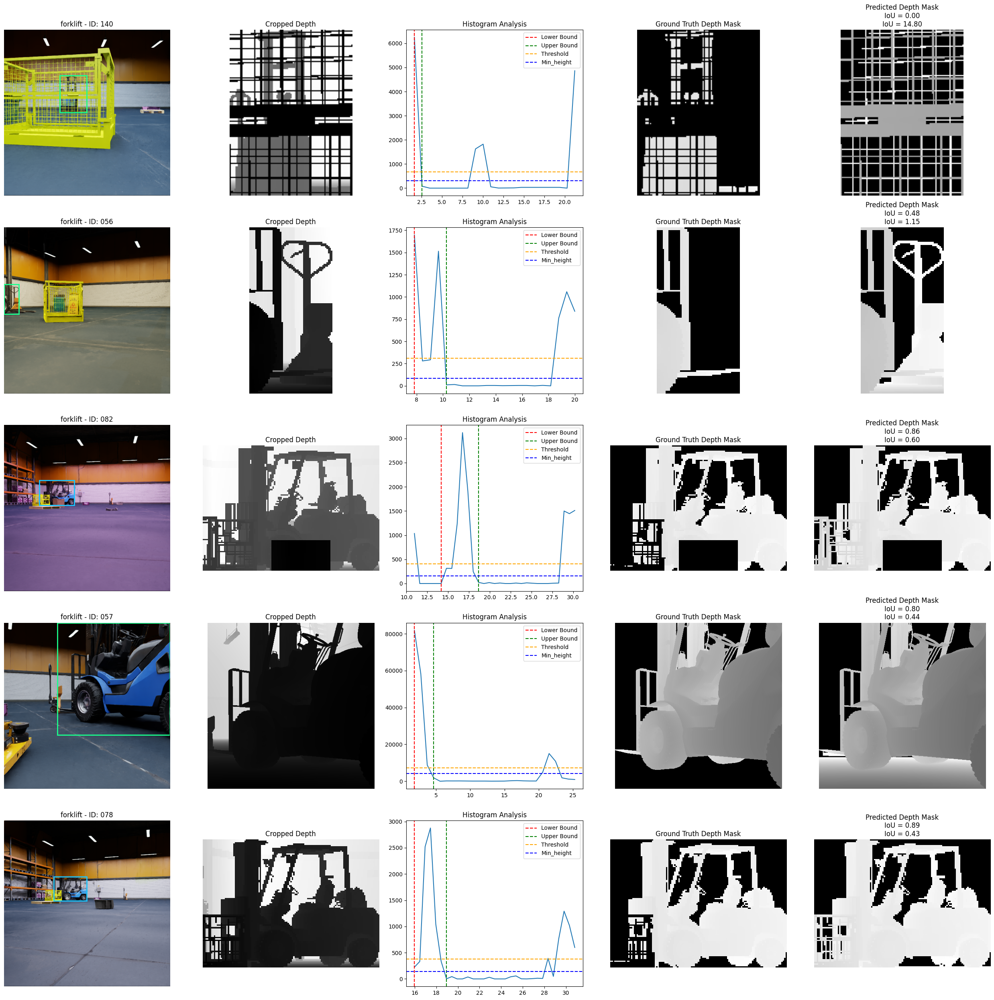

Class results [{'ID': '068', 'IOU': 0.0, 'Distance error': 13.81}]
Class results [{'ID': '152', 'IOU': 0.0, 'Distance error': 5.56}]
Class results [{'ID': '046', 'IOU': 0.28, 'Distance error': 1.97}]
Class results [{'ID': '057', 'IOU': 0.61, 'Distance error': 1.21}]
Class results [{'ID': '197', 'IOU': 0.63, 'Distance error': 0.58}]
Average execution time per run: 0.2289 seconds


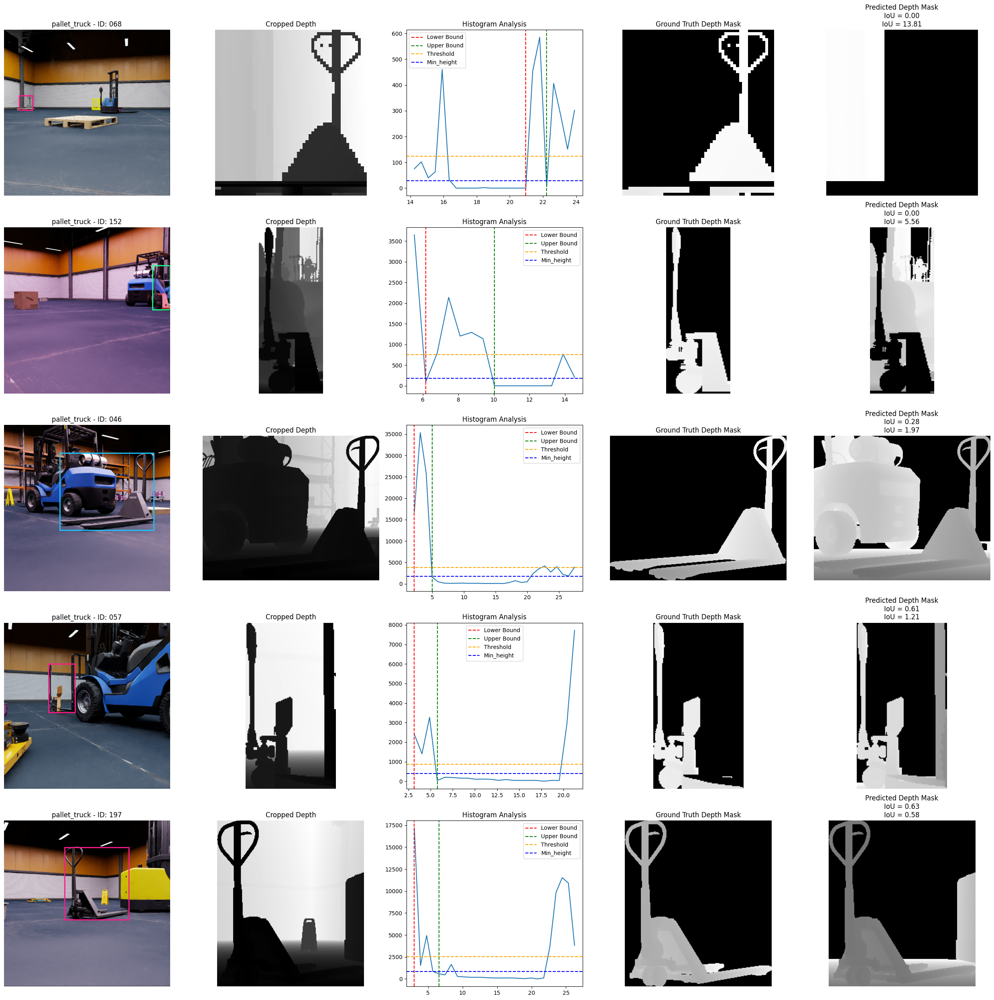

Class results [{'ID': '172', 'IOU': 0.0, 'Distance error': 18.72}]
Class results [{'ID': '070', 'IOU': 0.46, 'Distance error': 1.39}]
Class results [{'ID': '012', 'IOU': 0.65, 'Distance error': 1.02}]
Class results [{'ID': '014', 'IOU': 0.68, 'Distance error': 0.8}]
Class results [{'ID': '068', 'IOU': 0.49, 'Distance error': 0.78}]
Average execution time per run: 0.0032 seconds


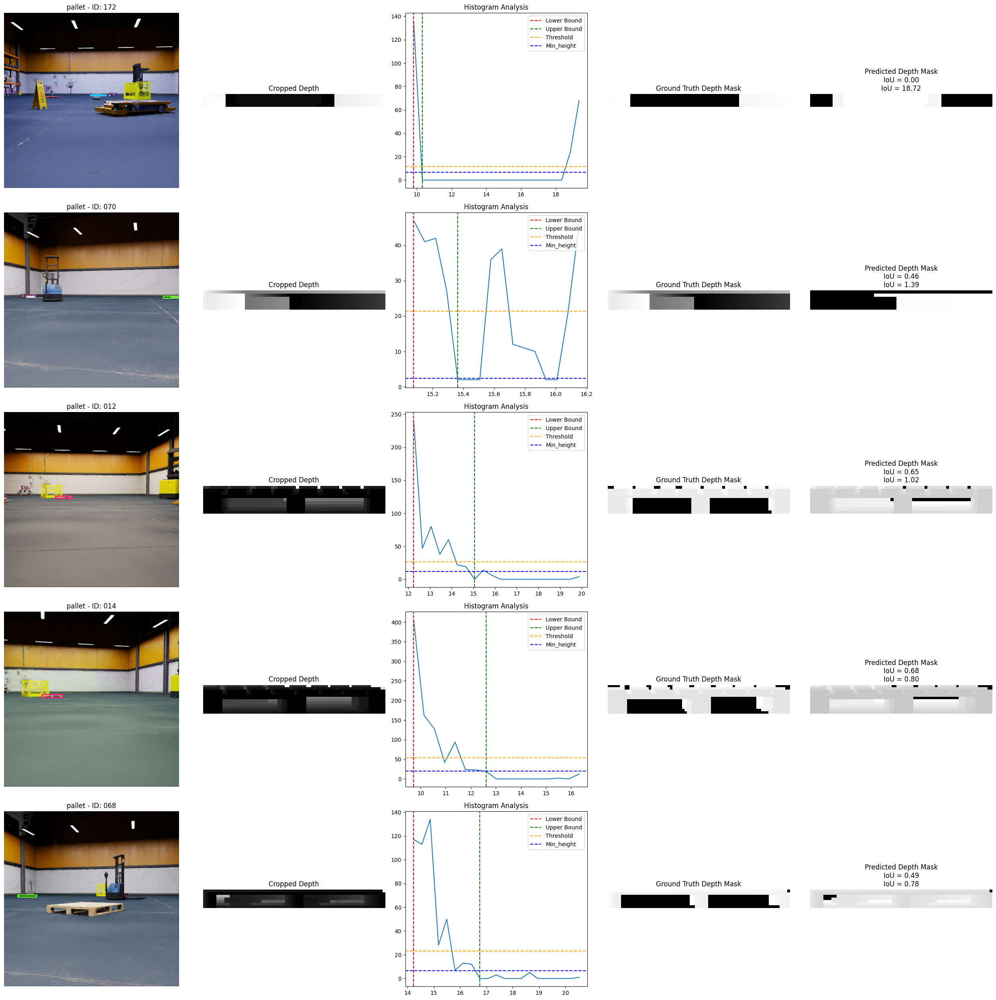

Class results [{'ID': '148', 'IOU': 0.58, 'Distance error': 1.01}]
Class results [{'ID': '146', 'IOU': 0.65, 'Distance error': 0.79}]
Class results [{'ID': '149', 'IOU': 0.67, 'Distance error': 0.59}]
Class results [{'ID': '176', 'IOU': 0.81, 'Distance error': 0.51}]
Class results [{'ID': '107', 'IOU': 0.78, 'Distance error': 0.44}]
Average execution time per run: 0.0276 seconds


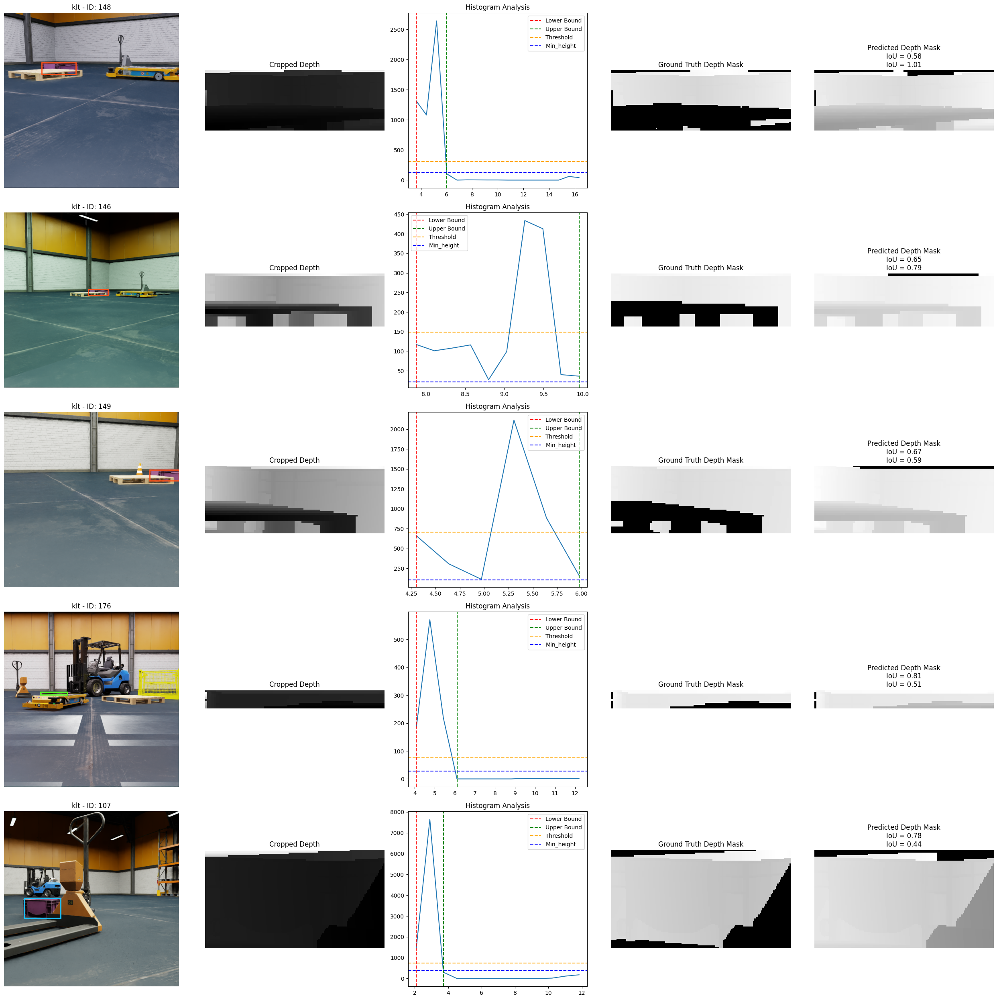

Class results [{'ID': '174', 'IOU': 0.0, 'Distance error': 11.93}]
Class results [{'ID': '156', 'IOU': 0.61, 'Distance error': 1.54}]
Class results [{'ID': '186', 'IOU': 0.57, 'Distance error': 1.01}]
Class results [{'ID': '011', 'IOU': 0.8, 'Distance error': 0.85}]
Class results [{'ID': '015', 'IOU': 0.81, 'Distance error': 0.82}]
Average execution time per run: 0.0330 seconds


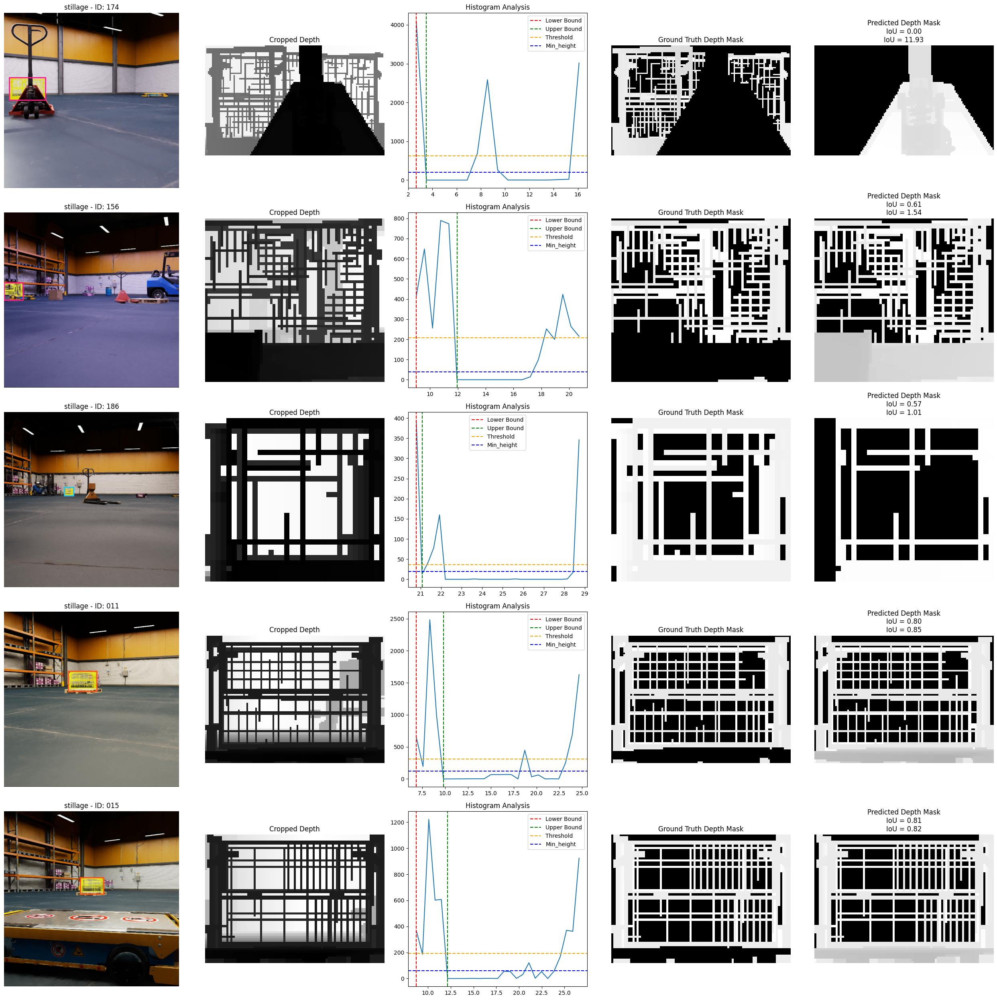


--- Overall Results Summary ---
Forklift Results: 120 entries
mAP@50: 0.9606
Average IOU: 0.9467
Average Distance error: 0.1261

Pallet_truck Results: 72 entries
mAP@50: 0.8985
Average IOU: 0.8681
Average Distance error: 0.1646

Pallet Results: 68 entries
mAP@50: 0.8463
Average IOU: 0.7984
Average Distance error: 0.2075

Klt Results: 96 entries
mAP@50: 0.9450
Average IOU: 0.9181
Average Distance error: 0.0940

Stillage Results: 90 entries
mAP@50: 0.9766
Average IOU: 0.9409
Average Distance error: 0.1169

--- Overall Averages ---
Average IoU: 0.8944, Average Distance error: 0.1418
Average mAP50: 0.9254
--- Overall Results Summary ---
                 Entries  Average IoU  Average Distance error    mAP@50
forklift           120.0     0.946750                0.126134  0.960562
pallet_truck        72.0     0.868056                0.164571  0.898489
pallet              68.0     0.798382                0.207463  0.846285
klt                 96.0     0.918125                0.093958  0.94501

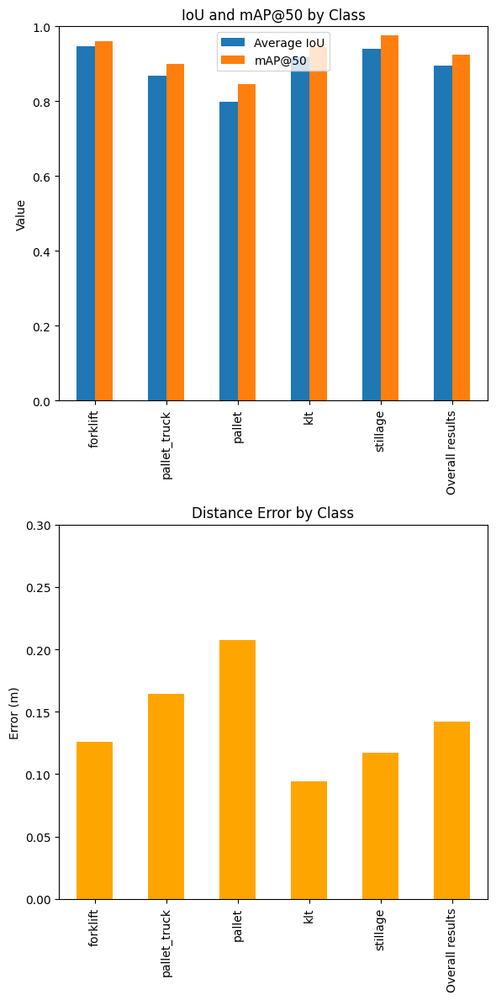

In [15]:
import os
import numpy as np
import pandas as pd
import cv2

rgb_folder = os.path.join(folder_path, "rgb")
bb_folder = os.path.join(folder_path, "bb_tight")
depth_image_folder = os.path.join(folder_path, 'distance_to_camera')
camera_parameters_folder = os.path.join(folder_path, 'camera_params')
semantic_segmentation_folder = os.path.join(folder_path, 'semantic_segmentation')
classes_of_interest = ["forklift", "pallet_truck", "pallet", "klt", "stillage"]

# Initialize dictionaries for each class
klt_results = []
pallet_results = []
forklift_results = []
stillage_results = []
pallet_truck_results = []

ignore_background = False
_count = 0
resolution = 1
height_percentage = 5

# Iterate over files in the semantic segmentation directory
sorted_file_names = sorted(
    [filename for filename in os.listdir(semantic_segmentation_folder) if filename.endswith('_semantic_segmentation_labels.json')]
)
for filename in sorted_file_names:
    file_id = filename.split('_')[0]
    file_path = os.path.join(semantic_segmentation_folder, filename)
    

    # Define paths for depth and segmentation images using the new naming format
    depth_image_path = os.path.join(depth_image_folder, f'{file_id}_distance_to_camera.npy')
    segmentation_image_path = os.path.join(semantic_segmentation_folder, f'{file_id}_semantic_segmentation.png')
    camera_parameters_path = os.path.join( camera_parameters_folder, f'{file_id}_camera_params.json')
    # Check if the depth image and segmentation image exist
    if os.path.exists(depth_image_path) and os.path.exists(segmentation_image_path):
        depth_image = np.load(depth_image_path)  # Load the depth image
        segmentation_image = cv2.imread(segmentation_image_path, cv2.IMREAD_UNCHANGED)  # Load the segmentation image

        for class_of_interest in classes_of_interest:
            if (class_of_interest == 'forklift' or class_of_interest == 'pallet_truck'):
                ignore_background = True
            else: ignore_background = False
            # Extract colors and bounding boxes for each class of interest
            color = extract_class_colors(file_path, class_of_interest)
            if color is not None:
                _count += 1
                bounding_boxes = find_bounding_boxes(bb_folder, bb_folder, file_id, class_of_interest)

                # Crop depth and segmentation images for each bounding box
                for bbox in bounding_boxes:
                    cropped_depth = crop_image_with_bbox(depth_image, bbox)
                    cropped_segmentation = crop_image_with_bbox(segmentation_image, bbox)

                    try:
                        # Generate mask and apply depth filtering
                        masked_segmented_images = generate_mask(cropped_segmentation, color)
                        ground_truth = crop_depth_image_with_mask(cropped_depth, masked_segmented_images)
                        prediction, hist, bin_edges, lower_bound, upper_bound, average_height, min_height = apply_cumulative_hist_depth_filter(cropped_depth, ignore_background, resolution, height_percentage)

                        # Calculate IoU and distance error
                        iou = compare_masks(ground_truth, prediction)
                        
                        gt_distance, gt_local_pose = estimate_3d_distance(ground_truth, camera_parameters_path)
                        pred_distance, predicted_local_pose = estimate_3d_distance(prediction, camera_parameters_path)
                        distance_error = compare_poses(gt_local_pose, predicted_local_pose)

                        # Add results to the correct class-specific dictionary
                        if class_of_interest == "forklift":
                            update_class_results(forklift_results, file_id, iou, distance_error)
                        elif class_of_interest == "pallet_truck":
                            update_class_results(pallet_truck_results, file_id, iou, distance_error)
                        elif class_of_interest == "pallet":
                            update_class_results(pallet_results, file_id, iou, distance_error)
                        elif class_of_interest == "klt":
                            update_class_results(klt_results, file_id, iou, distance_error)
                        elif class_of_interest == "stillage":
                            update_class_results(stillage_results, file_id, iou, distance_error)
                                
                    except ValueError as e:
                        # print (file_id, e)
                        continue       
    else:
        print("Path", depth_image_path, "or", segmentation_image_path, "do not exist")                   

classes = ["forklift", "forklift", "forklift", "forklift", "forklift"]
sorted_results = sorted(forklift_results, key=lambda x: x['Distance error'], reverse=True)
plot_class_examples(classes, resolution, height_percentage,
                    [sorted_results[0]],
                    [sorted_results[1]],
                    [sorted_results[2]],
                    [sorted_results[3]],
                    [sorted_results[4]], 
                    rgb_folder, depth_image_folder, semantic_segmentation_folder, bb_folder) 

classes = ["pallet_truck", "pallet_truck", "pallet_truck", "pallet_truck", "pallet_truck"]
sorted_results = sorted(pallet_truck_results, key=lambda x: x['Distance error'], reverse=True)
plot_class_examples(classes, resolution, height_percentage,
                    [sorted_results[0]],
                    [sorted_results[1]],
                    [sorted_results[2]],
                    [sorted_results[3]],
                    [sorted_results[4]], 
                    rgb_folder, depth_image_folder, semantic_segmentation_folder, bb_folder) 

classes = ["pallet", "pallet", "pallet", "pallet", "pallet"]
sorted_results = sorted(pallet_results, key=lambda x: x['Distance error'], reverse=True)
plot_class_examples(classes, resolution, height_percentage,
                    [sorted_results[0]],
                    [sorted_results[1]],
                    [sorted_results[2]],
                    [sorted_results[3]],
                    [sorted_results[4]], 
                    rgb_folder, depth_image_folder, semantic_segmentation_folder, bb_folder)

classes = ["klt", "klt", "klt", "klt", "klt"]
sorted_results = sorted(klt_results, key=lambda x: x['Distance error'], reverse=True)
plot_class_examples(classes, resolution, height_percentage,
                    [sorted_results[0]],
                    [sorted_results[1]],
                    [sorted_results[2]],
                    [sorted_results[3]],
                    [sorted_results[4]], 
                    rgb_folder, depth_image_folder, semantic_segmentation_folder, bb_folder)

classes = ["stillage", "stillage", "stillage", "stillage", "stillage"]
sorted_results = sorted(stillage_results, key=lambda x: x['Distance error'], reverse=True)
plot_class_examples(classes, resolution, height_percentage,
                    [sorted_results[0]],
                    [sorted_results[1]],
                    [sorted_results[2]],
                    [sorted_results[3]],
                    [sorted_results[4]], 
                    rgb_folder, depth_image_folder, semantic_segmentation_folder, bb_folder)

# Overall results summary
print("\n--- Overall Results Summary ---")
overall_results = {
    "forklift":     forklift_results      ,
    "pallet_truck": pallet_truck_results  ,
    "pallet":       pallet_results        ,
    "klt":          klt_results           ,
    "stillage":     stillage_results      ,
}

# Print overall results and calculate averages
overall_iou = 0
total_entries = 0
overall_map50 = 0
overall_count = 0
overall_distance_error = 0
overall_average_results = {}

for class_name, results in overall_results.items():
    average = calculate_class_averages(results)
    overall_map50 += average['mAP']
    overall_iou += average['Average IOU']  # Weighted sum for overall average
    overall_distance_error += average['Average Distance error'] # Weighted sum for overall average
    overall_count += len (results)

    # Print average values for each class
    print(f"{class_name.capitalize()} Results: {len(results)} entries")
    print(f"mAP@50: {average['mAP']:.4f}")
    print(f"Average IOU: {average['Average IOU']:.4f}")
    print(f"Average Distance error: {average['Average Distance error']:.4f}")
    print()  # New line for better readability
    overall_average_results[class_name] = {
        "Entries": len(results),
        "Average IoU": average['Average IOU'],
        "Average Distance error": average['Average Distance error'],
        "mAP@50": average['mAP'],
    }

# Calculate overall averages
if len(classes) > 0:
    overall_average_iou = overall_iou / len(classes)
    overall_average_map50 = overall_map50 / len(classes)
    overall_average_distance_error = overall_distance_error / len(classes)
else:
    overall_average_iou = 0
    overall_average_map50 = 0
    overall_average_distance_error = 0

overall_averages = {
    "Average IOU": overall_average_iou,
    "Average Distance error": overall_average_map50,
    "Average mAP50": overall_average_distance_error
}

# Convert to DataFrame for easier visualization
overall_average_results['Overall results'] = {
        "Entries": overall_count,
        "Average IoU": overall_average_iou,
        "Average Distance error": overall_average_distance_error,
        "mAP@50": overall_average_map50,}

results_df = pd.DataFrame(overall_average_results).T
overall_avg_df = pd.DataFrame([overall_averages])

# Print overall averages
print("--- Overall Averages ---")
print(f"Average IoU: {overall_average_iou:.4f}, Average Distance error: {overall_average_distance_error:.4f}")
print(f"Average mAP50: {overall_average_map50:.4f}")

# Print the table
print("--- Overall Results Summary ---")
print(results_df.to_string())
print("--- Overall Averages ---")
print(overall_avg_df.to_string(index=False))

# Plot column graphs
fig, axs = plt.subplots(2, 1, figsize=(6, 12))

# Plot 1: Average IOU and mAP50
results_df[["Average IoU", "mAP@50"]].plot(kind="bar", ax=axs[0], title="IoU and mAP@50 by Class")
axs[0].set_ylabel("Value")
axs[0].set_ylim(0, 1)

# Plot 2: Average Distance Error
results_df["Average Distance error"].plot(kind="bar", color="orange", ax=axs[1], title="Distance Error by Class")
axs[1].set_ylabel("Error (m)")
axs[1].set_ylim(0, 0.3)

plt.tight_layout()
plt.show()


Class results [{'ID': '157', 'IOU': 0.96, 'Distance error': 0.15}]
Class results [{'ID': '134', 'IOU': 0.95, 'Distance error': 0.05}]
Class results [{'ID': '014', 'IOU': 0.68, 'Distance error': 0.8}]
Class results [{'ID': '038', 'IOU': 0.98, 'Distance error': 0.02}]
Class results [{'ID': '015', 'IOU': 0.81, 'Distance error': 0.82}]
Average execution time per run: 0.0281 seconds


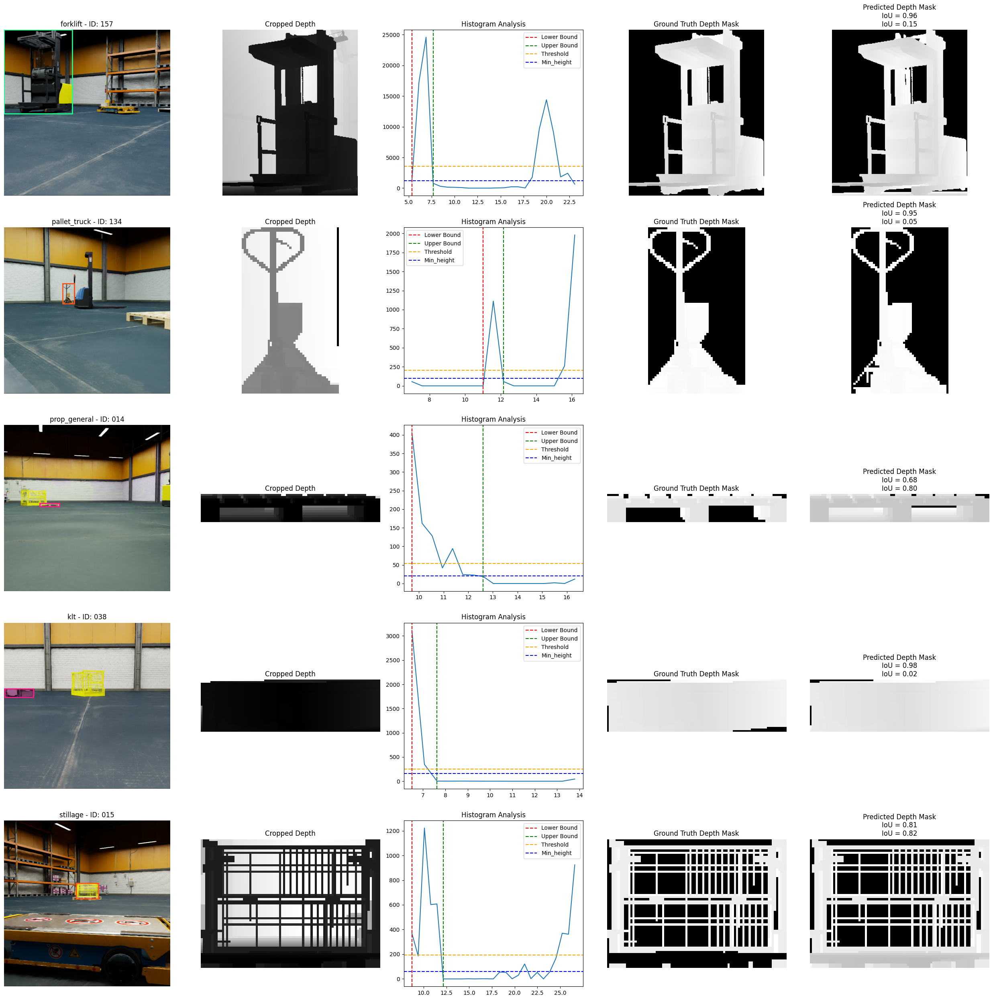

In [721]:
classes = ["forklift", "pallet_truck", "pallet", "klt", "stillage"]
plot_class_examples(classes, resolution, height_percentage,
                    [random.choice(forklift_results)],
                    [random.choice(pallet_truck_results)],
                    [random.choice(pallet_results)],
                    [random.choice(klt_results)],
                    [random.choice(stillage_results)], 
                    rgb_folder, depth_image_folder, semantic_segmentation_folder, bb_folder)